#1-Conversion en niveaux de gris


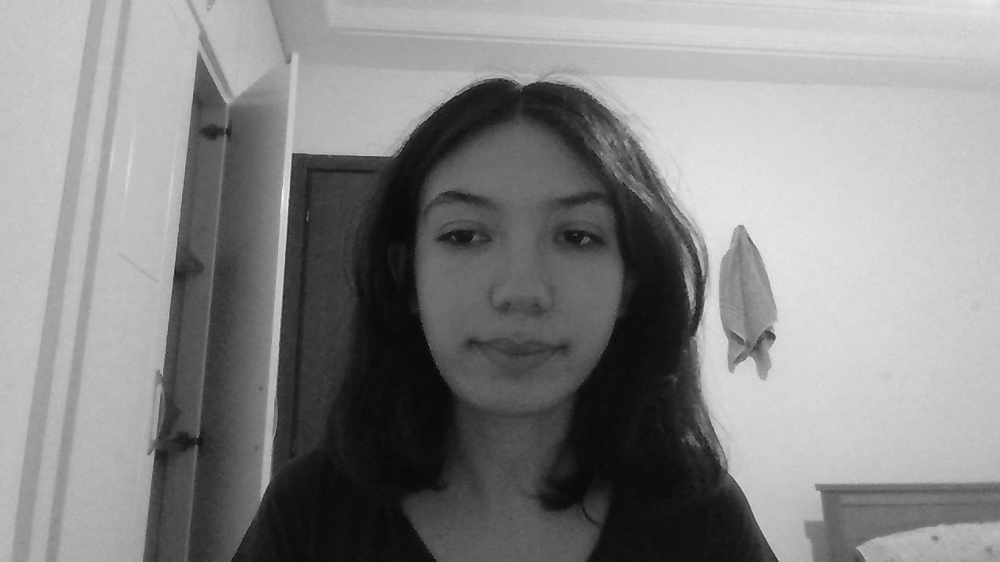

Frame gray sauvegardée : /content/frames/frames_gray/frame_0.png


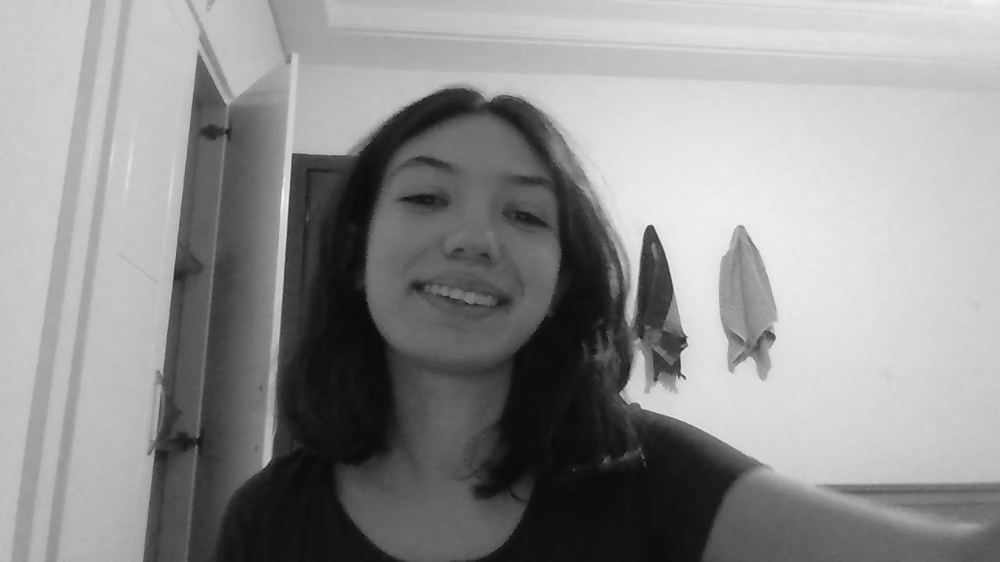

Frame gray sauvegardée : /content/frames/frames_gray/frame_50.png


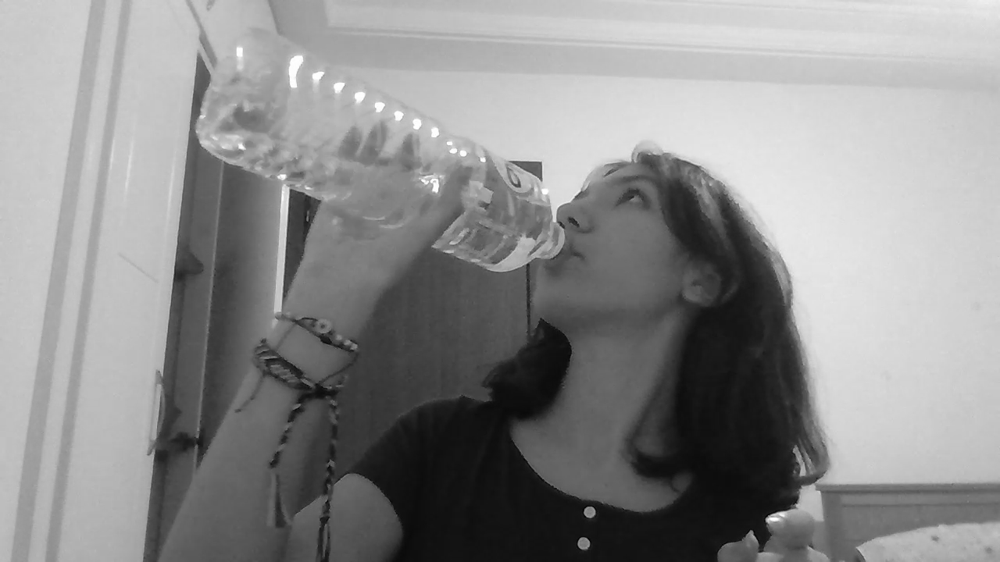

Frame gray sauvegardée : /content/frames/frames_gray/frame_100.png


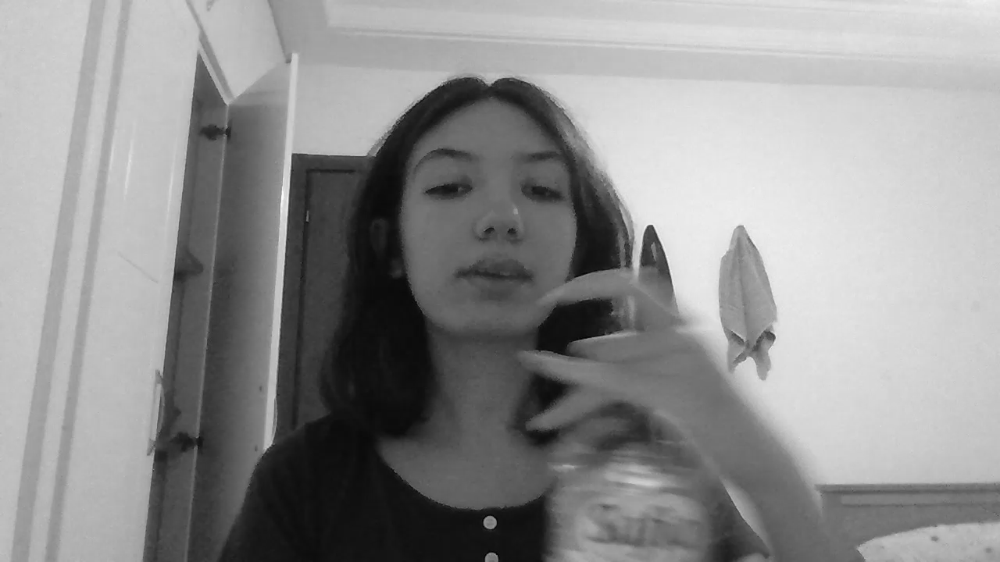

Frame gray sauvegardée : /content/frames/frames_gray/frame_150.png


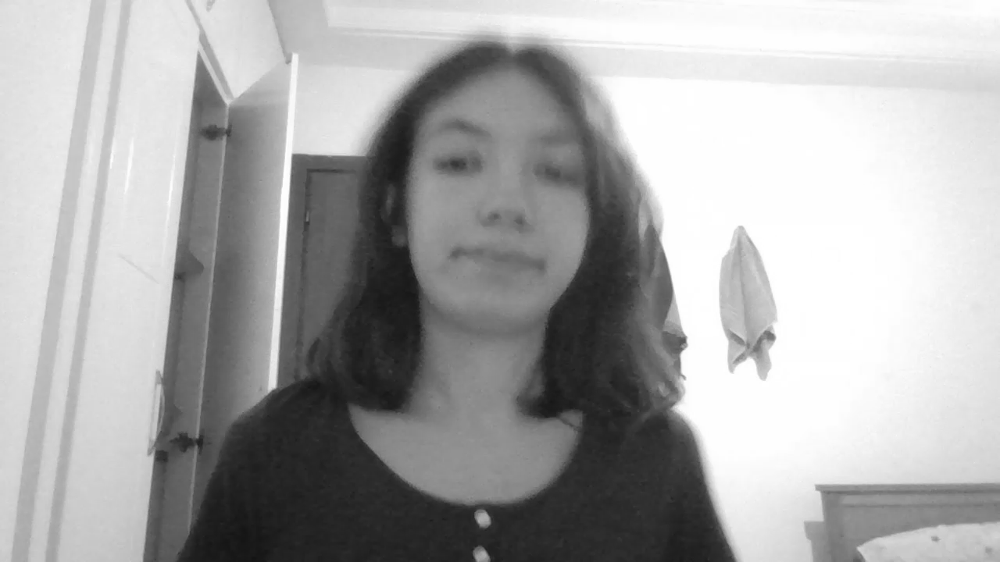

Frame gray sauvegardée : /content/frames/frames_gray/frame_200.png


In [2]:
import cv2
from google.colab.patches import cv2_imshow
video = cv2.VideoCapture("/content/sample_data/my_video.mp4")
frame_number = 0
while True:
  ret1, frame1 = video.read()
  if not ret1:
    break
  gray_image = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)

  if frame_number % 50 == 0:

    cv2_imshow( gray_image)
    filename = f"/content/frames/frames_gray/frame_{frame_number}.png"
    cv2.imwrite(filename, gray_image)
    print(f"Frame gray sauvegardée : {filename}")

  frame_number += 1

#2-Seuillage global heuristique


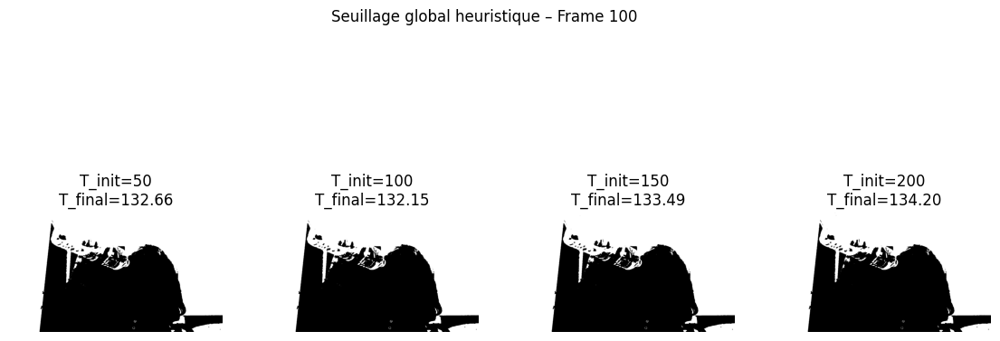

In [5]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Fonction du seuillage global heuristique
def seuillage_global(image, T_init=100, epsilon=1):
    T = T_init
    while True:
        G1 = image[image < T]
        G2 = image[image >= T]
        if len(G1) == 0 or len(G2) == 0:
            break
        T_new = 0.5 * (G1.mean() + G2.mean())
        if abs(T - T_new) < epsilon:
            break
        T = T_new
    _, thresh = cv2.threshold(image, T, 255, cv2.THRESH_BINARY)
    return thresh, T

# Lecture d'une frame d'intérêt
video = cv2.VideoCapture("/content/sample_data/my_video.mp4")

# Choisis la frame d'intérêt (ex. la 60e image)
frame_index = 100
video.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

ret, frame = video.read()
video.release()

if not ret:
    print("Erreur : impossible de lire la frame demandée.")
else:
    # Conversion en niveaux de gris
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Test avec différents T_init
    T_inits = [50, 100, 150, 200]
    results = []

    for T_init in T_inits:
        thresh, T_final = seuillage_global(gray, T_init)
        results.append((T_init, T_final, thresh))

    # Affichage des résultats
    plt.figure(figsize=(14, 6))
    for i, (T_init, T_final, thresh) in enumerate(results):
        plt.subplot(1, len(results), i + 1)
        plt.imshow(thresh, cmap='gray')
        plt.title(f"T_init={T_init}\nT_final={T_final:.2f}")
        plt.axis('off')

    plt.suptitle(f"Seuillage global heuristique – Frame {frame_index}")
    plt.show()


#3-Méthode d’Otsu sur toutes les frames

Vidéo chargée avec succès !
Frame 0


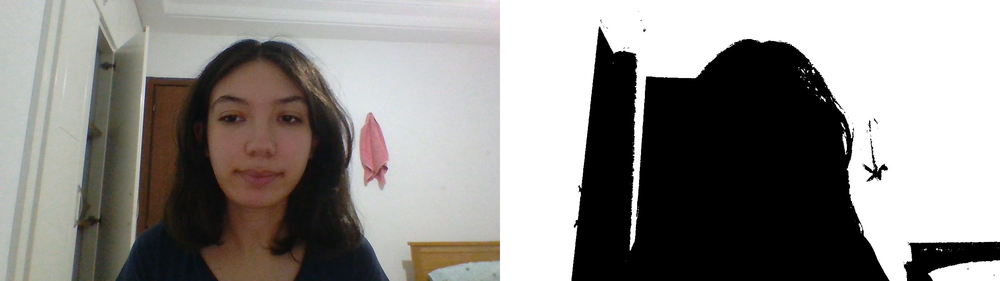

Frame 20


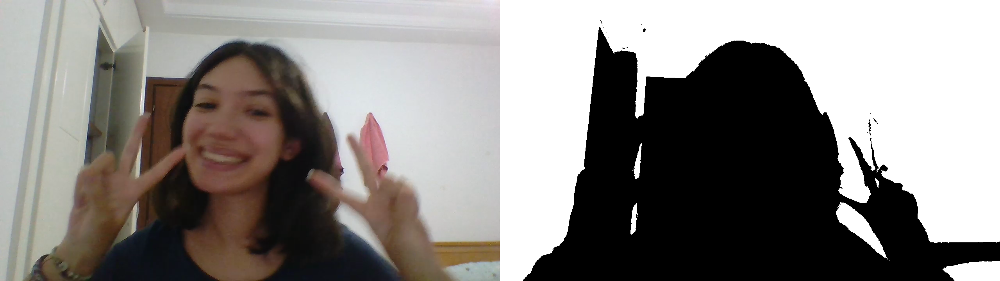

Frame 40


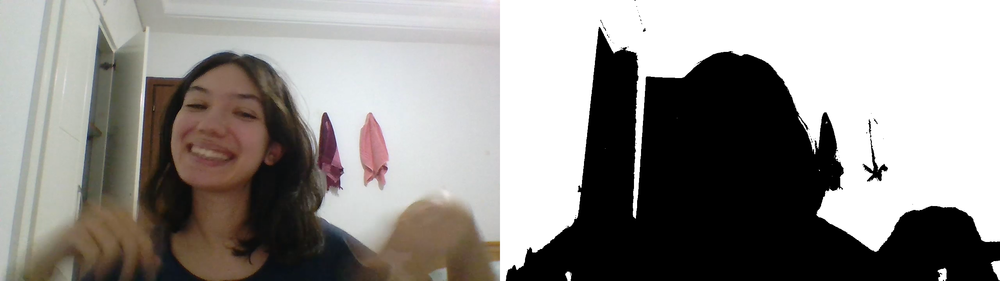

Frame 60


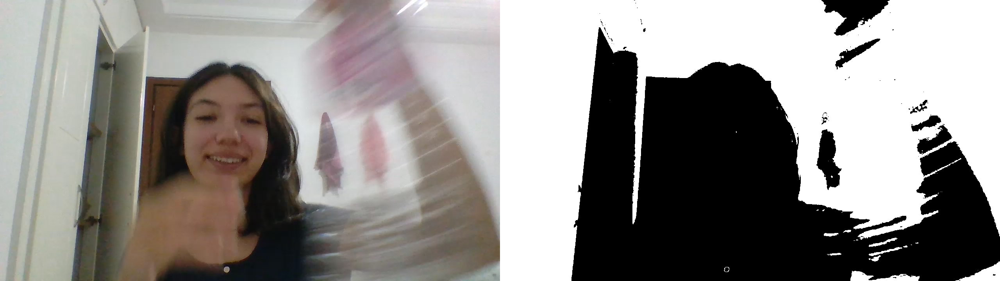

Frame 80


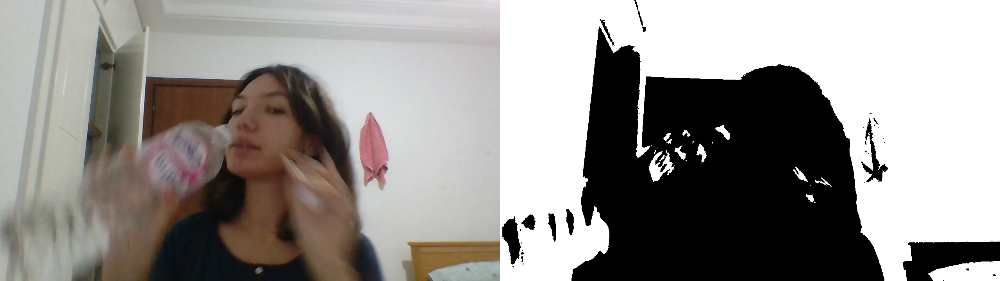

Frame 100


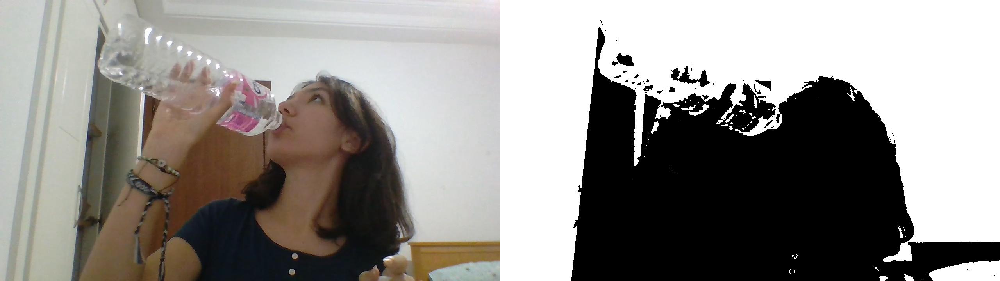

Frame 120


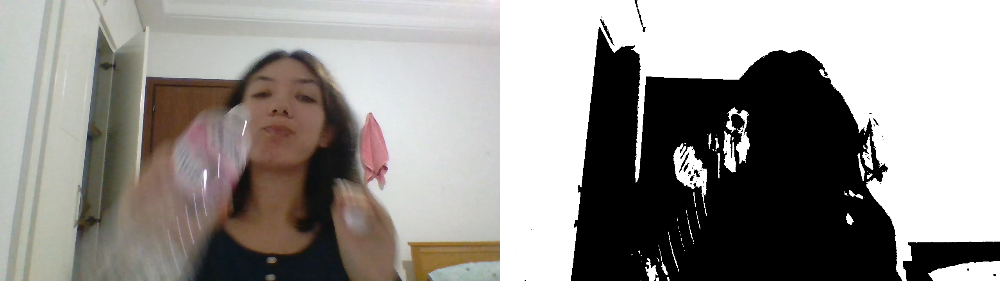

Frame 140


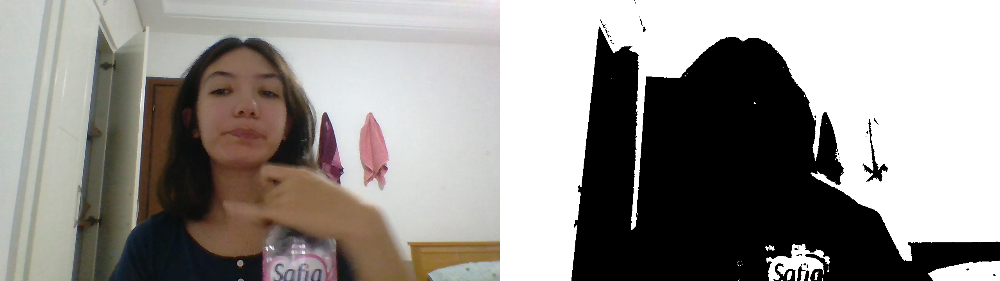

Frame 160


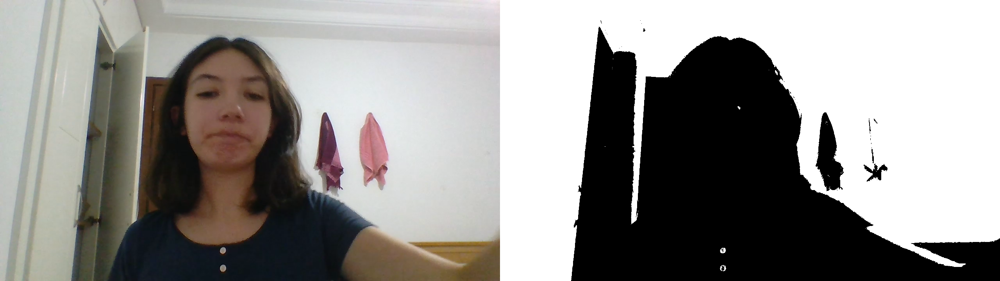

Frame 180


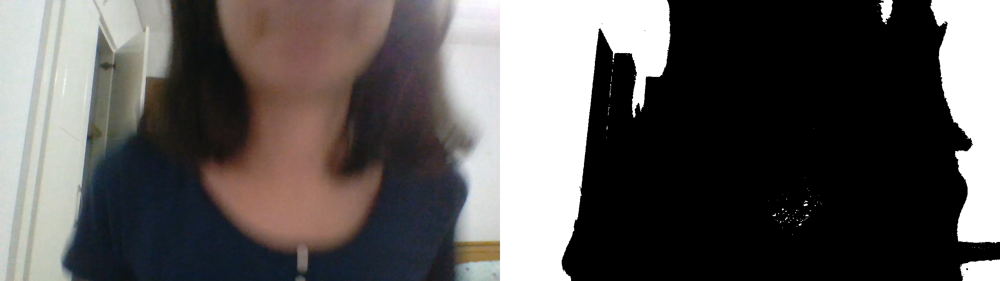

Frame 200


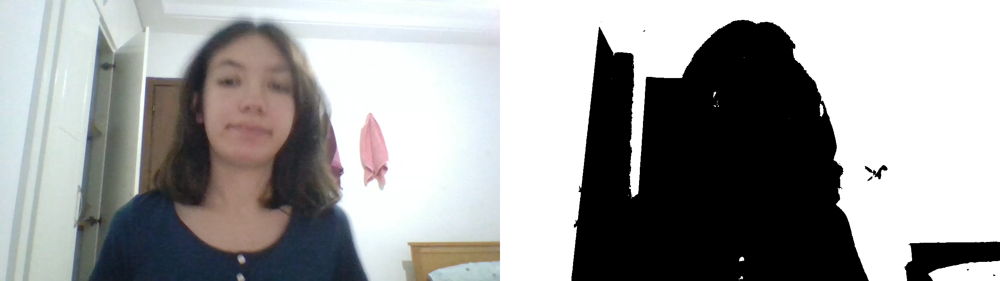

Frame 220


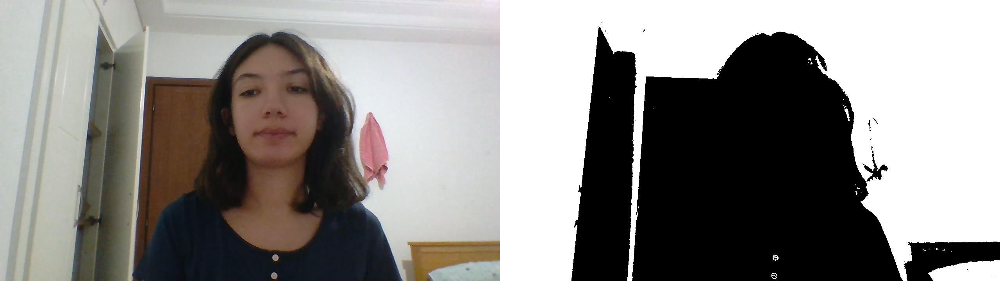

Segmentation Otsu terminée.


In [6]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

#Chargement de la vidéo
video = cv2.VideoCapture("/content/sample_data/my_video.mp4")

if not video.isOpened():
    print("Erreur : impossible de charger la vidéo.")
else:
    print("Vidéo chargée avec succès !")

frame_number = 0

while True:
    ret, frame = video.read()
    if not ret:
        break

    #Conversion en niveaux de gris
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    #Application du seuillage d’Otsu
    _, thresh_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    #Combinaison côte à côte
    # La frame seuillée est en niveaux de gris, on la convertit en 3 canaux pour concaténation
    thresh_otsu_color = cv2.cvtColor(thresh_otsu, cv2.COLOR_GRAY2BGR)
    combined = np.hstack((frame, thresh_otsu_color))

    # Afficher une frame toutes les 20 frames pour alléger la sortie
    if frame_number % 20 == 0:
        print(f"Frame {frame_number}")
        cv2_imshow(combined)

    frame_number += 1

video.release()
print("Segmentation Otsu terminée.")
